# Self-Driving Car Engineer Nanodegree


## Project: **Advanced Finding Lane Lines on the Road** 
***
This project focused on lane finding from a dashboard mounted camera. First, an image analysis pipeline is developed using a series of individual images, and then applied a video stream to assess the performance of lane finding with an environment with curved road features.

The program flow is as follows:
* Perform camera calibration
* Perform distortion correction
* Perform top-down perspective transform
* Investigate color/gradient threshold transformations
* Extract lane line features from top-down image
* Calculate lane curvature through polynomial fit
* Overlay lane visualization on video frames and print out metrics

### Import Packages

In [2]:
#importing some useful packages
import os
import numpy as np
import cv2
import math
import glob
import pickle

import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline

### Read in example image and verify shape

Image type: <class 'numpy.ndarray'>
Image shape: (720, 1280, 3)


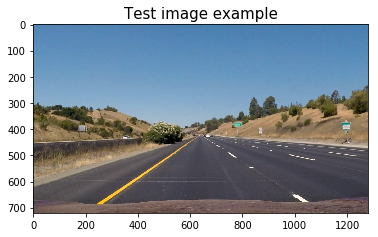

In [3]:
# Read in a test image

test_image = mpimg.imread('test_images/straight_lines1.jpg')

# Check image type, shape

print('Image type:', type(test_image))
print('Image shape:', test_image.shape)
plt.title('Test image example', fontsize=15)
plt.imshow(test_image)

### Define Useful Functions

In [4]:
# Define a function to plot images for comparision as needed to show the result of transformations

def plot_two_images(img1, img2, title_1, title_2, outname = None, save = None):
    
    # Plot images
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))

    ax1.imshow(img1)
    ax1.set_title(title_1, fontsize=30)
    
    ax1.set_xlabel('x dimension', fontsize = 20)
    ax1.set_ylabel('y dimension', fontsize = 20)

    ax2.imshow(img2)
    ax2.set_title(title_2, fontsize=30)
    
    ax2.set_xlabel('x dimension', fontsize = 20)
    ax2.set_ylabel('y dimension', fontsize = 20)

    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    
    if save == True:
        plt.savefig('./output_images/' + outname + '.jpg')
    
    plt.show
    
    return

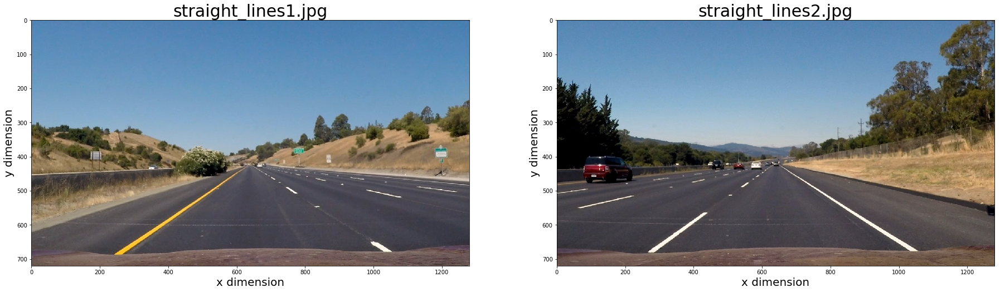

In [5]:
# Test image function

image_test1 = mpimg.imread('test_images/straight_lines1.jpg')
image_test2 = mpimg.imread('test_images/straight_lines2.jpg')

plot_two_images(image_test1, image_test2, title_1 = 'straight_lines1.jpg', title_2 = 'straight_lines2.jpg', outname = 'imageplottest', save = True)

### 1. Camera Calibration
***
ChessBoard calibration images are read in, then cv2 functions are used to identify the corners within the ChessBoard calibration images. The calibration information is then saved as a calibration file which can be used later when applying distortion correction.

In [6]:
# Define a set of object points
objp = np.zeros((6*9, 3), np.float32)
objp[:,:2] = np.mgrid[0:9, 0:6].T.reshape(-1,2)

# Define arrays to store object (3D space) and image (2D space) points from imported images
objpoints = []
imgpoints = []

# print a list of calibration images
images = glob.glob('./camera_cal/calibration*.jpg')

# Iterate through the list, searching for chesseboard corners
for idx, fname in enumerate(images):
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    # Use cv2 to find chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6), None)
    
    if ret == True:
        print('working on ', fname)
        objpoints.append(objp)
        imgpoints.append(corners)
        
        # Draw the found corners, save images to the output_images folder
        cv2.drawChessboardCorners(img, (9,6), corners, ret)
        write_name = 'corners_found' + str(idx) + '.jpg'
        cv2.imwrite('./output_images/chessboard_images/' + write_name, img)
        
# Load image for reference
img = cv2.imread('./camera_cal/calibration1.jpg')
img_size = (img.shape[1], img.shape[0])

# Perform camera calibration for the given object and image points
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size, None, None)

# Save the calibration file
dist_pickle = {}
dist_pickle["mtx"] = mtx
dist_pickle["dist"] = dist
pickle.dump(dist_pickle, open("./camera_cal/calibration_pickle.p", "wb"))

working on  ./camera_cal\calibration10.jpg
working on  ./camera_cal\calibration11.jpg
working on  ./camera_cal\calibration12.jpg
working on  ./camera_cal\calibration13.jpg
working on  ./camera_cal\calibration14.jpg
working on  ./camera_cal\calibration15.jpg
working on  ./camera_cal\calibration16.jpg
working on  ./camera_cal\calibration17.jpg
working on  ./camera_cal\calibration18.jpg
working on  ./camera_cal\calibration19.jpg
working on  ./camera_cal\calibration2.jpg
working on  ./camera_cal\calibration20.jpg
working on  ./camera_cal\calibration3.jpg
working on  ./camera_cal\calibration6.jpg
working on  ./camera_cal\calibration7.jpg
working on  ./camera_cal\calibration8.jpg
working on  ./camera_cal\calibration9.jpg


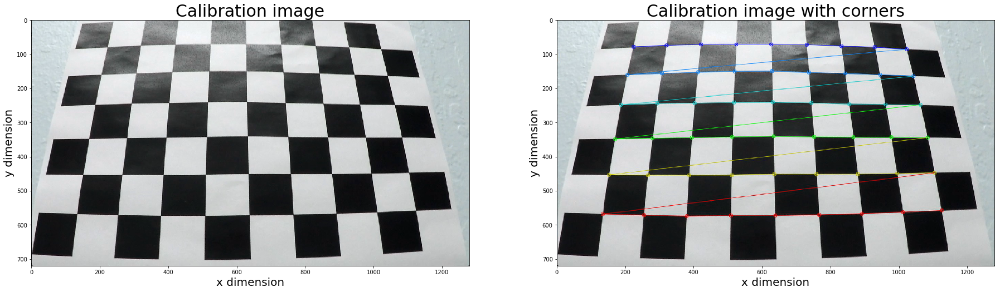

In [7]:
# Plot an example of the calibration image and after finding corners

cal_img_3 = cv2.imread('./camera_cal/calibration3.jpg')
foundlines_img_13 = cv2.imread('./output_images/chessboard_images/corners_found13.jpg')

plot_two_images(cal_img_3, foundlines_img_13,
                title_1 = 'Calibration image', title_2 = 'Calibration image with corners',
                outname = 'calibration_image_with_corners', save = True)

### Define Undistortion Function
***
The camera calibration file is used to undistort the images.

In [ ]:
# Read in the saved camera matrix and distortion coefficients

dist_pickle = pickle.load(open("camera_cal/calibration_pickle.p", "rb"))
mtx = dist_pickle["mtx"]
dist = dist_pickle["dist"]

In [9]:
# Read in a test image
img = cv2.imread('./camera_cal/calibration3.jpg')

# Define chessboard size parameters, nx (number of inside corners in x) and ny (number of inside corners in y)

nx = 9
ny = 6

def corners_unwarp(img, nx, ny, mtx, dist):
    
    # Undistort using mtx and dist
    img_size = (img.shape[1], img.shape[0])
    
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    
    # Convert image to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (nx,ny), None)
    
    # Darw corners if corners are found
    if ret == True:
        img = cv2.drawChessboardCorners(img, (nx,ny), corners, ret)
        
        # Define 4 source points src = np.float32([[,],[,],[,],[,]])
        # Detected corners found using the automatic corner detection
        offset = 100
        src = np.float32([corners[0], corners[nx-1], corners[-1], corners[-nx]])
            
        # Define 4 destination points dst = np.float32([[,],[,],[,],[,]])
        dst = np.float32([[offset, offset],[img_size[0]-offset, offset],[img_size[0]-offset, img_size[1]-offset],[offset, img_size[1]-offset]])
            
        # Use cv2.getPerspectiveTransform() to get M, the transform matrix
        M = cv2.getPerspectiveTransform(src, dst)
            
        # Use cv2.warpPerspective() to warp your image to a top-down view
        warped = cv2.warpPerspective(undist, M, img_size)
    
    return warped, M

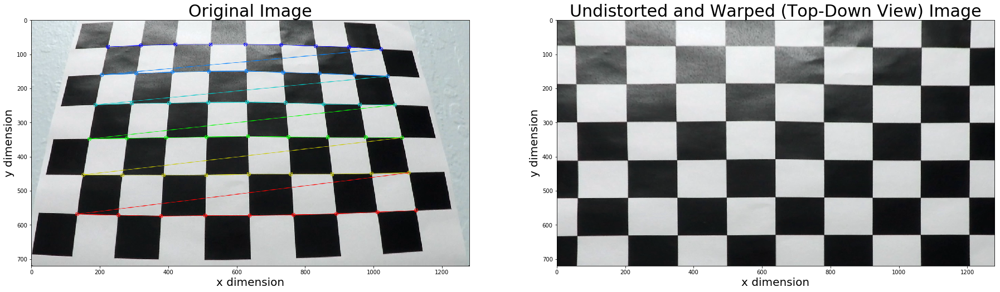

In [10]:
# Test the undistort and top-down transformation on a calibration image

top_down, perspective_M = corners_unwarp(img, nx, ny, mtx, dist)

plot_two_images(img, top_down,
                title_1 = 'Original Image', title_2 = 'Undistorted and Warped (Top-Down View) Image',
                outname = 'undistort_chessboard', save = True)

In [11]:
# Define a stand-alone function to perform the camera distortion correction

def undistort(image):
    
    dist_pickle = pickle.load(open("camera_cal/calibration_pickle.p", "rb"))
    mtx = dist_pickle["mtx"]
    dist = dist_pickle["dist"]
    
    undistorted = cv2.undistort(image, mtx, dist, None, mtx)
    
    return undistorted

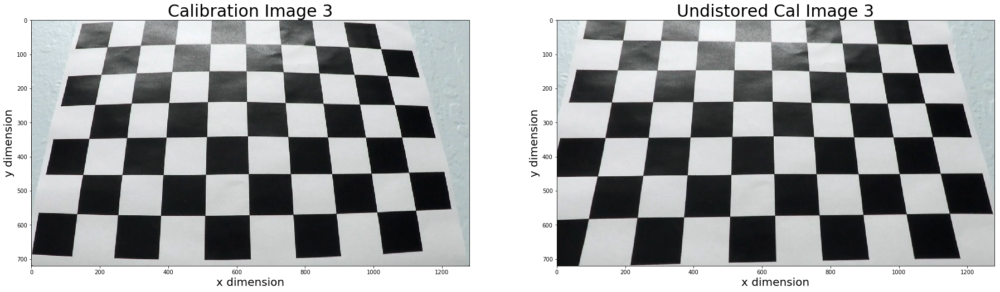

In [12]:
# Plot an example of a raw and undistored image

cal_img3 = cv2.imread('./camera_cal/calibration3.jpg')

cal_img3_undist = undistort(cal_img3)

plot_two_images(cal_img3, cal_img3_undist,
                title_1 = 'Calibration Image 3', title_2 = 'Undistored Cal Image 3',
                outname = 'cal_image_undistorted', save = True)

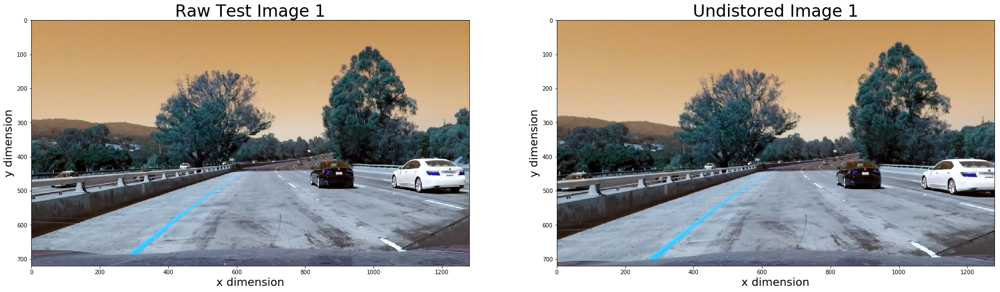

In [13]:
# Plot an example of a raw and undistored image

img_test1 = cv2.imread('./test_images/test1.jpg')

img_test1_undist = undistort(img_test1)

plot_two_images(img_test1, img_test1_undist,
                title_1 = 'Raw Test Image 1', title_2 = 'Undistored Image 1',
                outname = 'test_image_undistorted', save = True)

In [14]:
# Define a stand-alone function to perform the top-down perspective warp

def perspective_transform(image):

    img_size = (image.shape[1], image.shape[0])

    preprocessImage = np.zeros_like(img[:,:,0])

    bot_width = 0.75 # percent of bottom trapizoid height
    mid_width = 0.08 # percent of middle trapizoid height
    height_pct = 0.61 # percent for trapizoid width
    bottom_trim = 0.95 # percent from top to bottom to avoid car hood

    src = np.float32([[img.shape[1] * (0.5 - mid_width / 2), img.shape[0] * height_pct],
                      [img.shape[1] * (0.5 + mid_width / 2), img.shape[0] * height_pct],
                      [img.shape[1] * (0.5 + bot_width / 2), img.shape[0] * bottom_trim],
                      [img.shape[1] * (0.5 - bot_width / 2), img.shape[0] * bottom_trim]])

    offset = img_size[0] * 0.25

    dst = np.float32([[offset, 0], [img_size[0]-offset, 0], [img_size[0]-offset, img_size[1]], [offset, img_size[1]]])
    
    # Define topdown perspective transform

    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    
    warped = cv2.warpPerspective(image, M, img_size, flags = cv2.INTER_LINEAR)
    
    print("src array: ", src)
    print("dst array: ", dst)

    return warped

src array:  [[  588.79998779   439.20001221]
 [  691.20001221   439.20001221]
 [ 1120.           684.        ]
 [  160.           684.        ]]
dst array:  [[ 320.    0.]
 [ 960.    0.]
 [ 960.  720.]
 [ 320.  720.]]


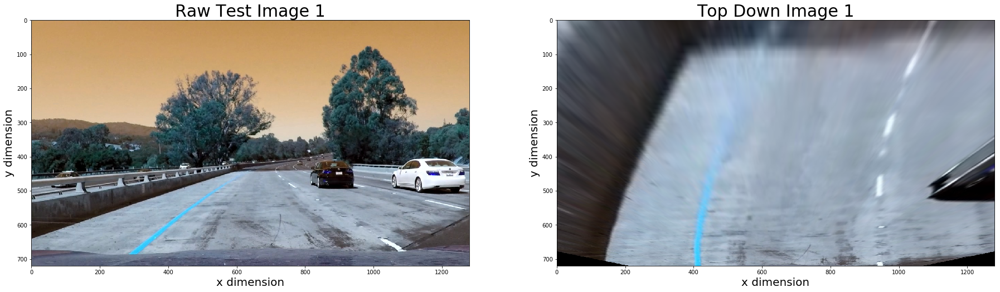

In [15]:
# Plot an example of a raw and undistored image

img_test1 = cv2.imread('./test_images/test1.jpg')

img_test1_undist = undistort(img_test1)
img_topdown = perspective_transform(img_test1_undist)

plot_two_images(img_test1, img_topdown,
                title_1 = 'Raw Test Image 1', title_2 = 'Top Down Image 1',
                outname = 'test_image_topdown', save = True)

In [16]:
# Hard code src and dst coordinates

src = np.float32([[588, 439],
                [691, 439],
                [1120, 684],
                [160, 684]])    

dst = np.float32([[320, 0],
                [960, 0],
                [960, 720],
                [320, 720]])

In [17]:
def topdown(image):
    
    M = cv2.getPerspectiveTransform(src, dst)
    warped = cv2.warpPerspective(image, M, (image.shape[1], image.shape[0]), flags=cv2.INTER_LINEAR)
    
    return warped


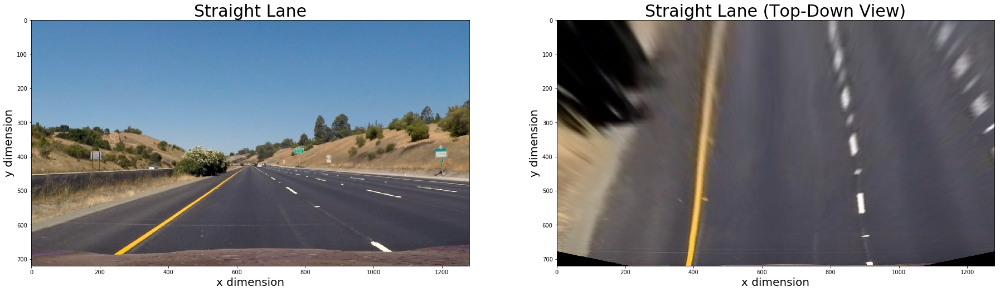

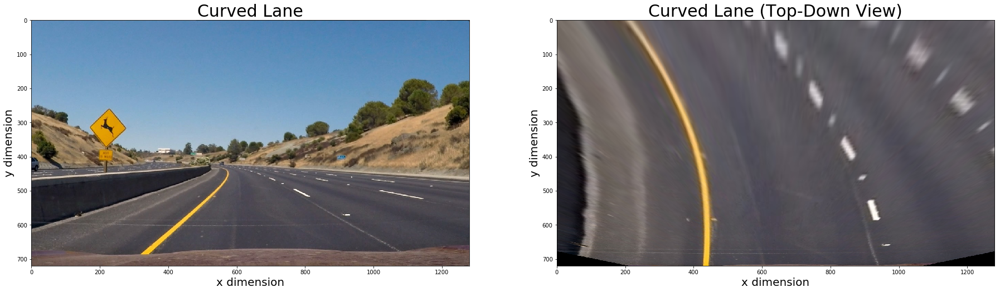

In [18]:
# Test the perspective transform on different lane types: straight vs. curved
# Print out example images of straight vs curved lanes

straight_lane_test = mpimg.imread('test_images/straight_lines1.jpg')
curved_lane_test = mpimg.imread('test_images/test2.jpg')

warp_test_straight = topdown(straight_lane_test)
warp_test_curved = topdown(curved_lane_test)

plot_two_images(straight_lane_test, warp_test_straight,
                title_1 = 'Straight Lane', title_2 = 'Straight Lane (Top-Down View)',
                outname = 'straight_lane_warp_test', save = True)

plot_two_images(curved_lane_test, warp_test_curved,
                title_1 = 'Curved Lane', title_2 = 'Curved Lane (Top-Down View)',
                outname = 'curved_lane_warp_test', save = True)

In [19]:
# Define a stand-alone unwarping function

def unwarp(image):
    
    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    
    newwarp = cv2.warpPerspective(image, Minv, (1280, 720))
    
    return newwarp

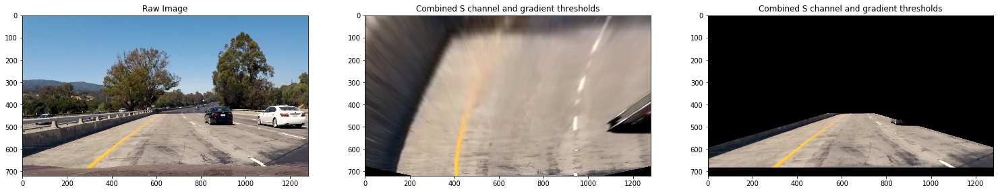

In [20]:
# Test the warping and unwarping of an image

img_test1 = mpimg.imread('test_images/test1.jpg')
undist1 = undistort(img_test1)
warped1 = topdown(undist1)
unwarped1 = unwarp(warped1)

# Plotting thresholded images
f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20,10))

ax1.set_title('Raw Image')
ax1.imshow(img_test1)

ax2.set_title('Combined S channel and gradient thresholds')
ax2.imshow(warped1, cmap='gray')

ax3.set_title('Combined S channel and gradient thresholds')
ax3.imshow(unwarped1, cmap='gray')

plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
plt.savefig('./output_images/' + 'warp_unwarp_example' + '.jpg')

In [21]:
# Run the topdown transform on all test images

images = glob.glob('./test_images/test*.jpg')

for idx, fname in enumerate(images):
    img = cv2.imread(fname)
    img = undistort(img)
    img = topdown(img)
    
    result = img
    
    write_name = './transformation_test/trans_test' + str(idx) + '.jpg'
    cv2.imwrite(write_name, result)

## Color Transformations
***
Investigate and define color transformations to use in identifiying lane features.

### Sobel Functions
***
Define the Sobel threshold transformation function.

In [ ]:
# Define the Absolute Sobel Threshold Function that applies Sobel x or y, and then takes an absolute value and applies a threshold.

def abs_sobel_thresh(img, orient='x', sobel_kernel = 5, thresh = (0, 255)):
    
    # Convert image to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    # Take the derivative in x or y given orient = 'x' or 'y'
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1)
        
    # Take the absolute value of the derivative or gradient
    if orient == 'x':
        abs_sobel = np.absolute(sobelx)
    if orient == 'y':
        abs_sobel = np.absolute(sobely)
    
    # Scale to 8-bit (0 - 255) then convert to type = np.uint8
    scaled_sobel = np.uint8(255 * abs_sobel / np.max(abs_sobel))
    
    # Create a mask of 1's where the scaled gradient magnitude 
    binary_output = np.zeros_like(scaled_sobel)
    binary_output[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1
    
    return binary_output

In [ ]:
# Test the abs_sobel_thresh function
# Read in a test image and grayscale it
image_test = mpimg.imread('test_images/straight_lines1.jpg')
    
# Run the function to test
grad_binary = abs_sobel_thresh(image_test, orient='x', thresh = (20, 250))

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()

ax1.imshow(image_test)
ax1.set_title('Original Image', fontsize=30)

ax2.imshow(grad_binary, cmap='gray')
ax2.set_title('Absolute Sobel Threshold Applied', fontsize=30)

plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
plt.savefig('./output_images/' + 'abs_soble_thresh_test' + '.jpg')

In [ ]:
# Define and test the Magnitude Sobel Threshold Function.

def mag_thresh(image, sobel_kernel = 3, mag_thresh = (0, 255)):
    
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize = sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize = sobel_kernel)
    
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    scale_factor = np.max(gradmag)/255
    gradmag = (gradmag / scale_factor).astype(np.uint8)
    binary_output = np.zeros_like(gradmag)
    
    binary_output[(gradmag >= mag_thresh[0]) & (gradmag < mag_thresh[1])] = 1
    
    return binary_output

In [ ]:
# Test the mag_thresh function on test_image    

mag_thresh_test = mag_thresh(image_test, sobel_kernel = 3, mag_thresh = (50, 255))

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()

ax1.imshow(image_test)
ax1.set_title('Original Image', fontsize=30)

ax2.imshow(mag_thresh_test, cmap='gray')
ax2.set_title('Sobel Magnitude Thresholded Applied', fontsize=30)

plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
plt.savefig('./output_images/' + 'mag_thresh_test' + '.jpg')

### Color Filtering and Transformations
***
...

In [ ]:
# Define HLS Color Threshold Function that thresholds the S-channel of HLS and test it.

def hls_select(img, thresh=(0, 255)):
    
    # Convert to HLS color space
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    s_channel = hls[:,:,2]
    
    # Apply a threshold to the S channel
    binary_output = np.zeros_like(s_channel)
    binary_output[(s_channel > thresh[0]) & (s_channel <= thresh[1])] = 1
    
    return binary_output

In [ ]:
# Test the hls_select function

hls_binary = hls_select(image_test, thresh=(50, 255))

# Read in a test image
#image = mpimg.imread('test_images/straight_lines1.jpg') 

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()

ax1.imshow(image_test)
ax1.set_title('Original Image', fontsize=30)

ax2.imshow(hls_binary, cmap='gray')

ax2.set_title('Thresholded S Channel', fontsize=30)

plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
plt.savefig('./output_images/' + 'hls_binary_test' + '.jpg')

In [ ]:
# Define a color threshold function with HLS and HSV and test it.

def color_threshold(image, sthresh = (0,255), vthresh=(0,255)):
    
    hls = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
    s_channel = hls[:,:,2]
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= sthresh[0]) & (s_channel <= sthresh[1])] = 1
    
    hsv = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
    v_channel = hsv[:,:,2]
    v_binary = np.zeros_like(v_channel)
    v_binary[(v_channel >= vthresh[0]) & (v_channel <= vthresh[1])] = 1
    
    output = np.zeros_like(s_channel)
    output[(s_binary == 1) & (v_binary == 1)] = 1
    
    return output

In [ ]:
# Test the color_threshold function

# Read in a test image
#image_test = mpimg.imread('test_images/straight_lines1.jpg')

thresh_test = color_threshold(image_test, sthresh = (50,255), vthresh = (50,255))

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()

ax1.imshow(image_test)
ax1.set_title('Original Image', fontsize=30)

ax2.imshow(thresh_test, cmap='gray')
ax2.set_title('Combined HLS and HSV Threshold Test', fontsize=30)

plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
plt.savefig('./output_images/' + 'color_thresh_test' + '.jpg')

In [ ]:
### Binary Image for Pipeline Funciton
Define the final pipeline for producing the binary output image.

In [ ]:
def pipeline_color(img, s_thresh=(170, 255), sx_thresh=(20, 100), sobel_kernel=9):
    
    # Convert to HLS color space and separate the S channel
    # Note: img is the undistorted image
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
    
    l_channel = hls[:,:,1]
    s_channel = hls[:,:,2]

    # Grayscale image
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

    # Sobel x
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0) # Take the derivative in x
    #sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize = sobel_kernel)
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255 * abs_sobelx / np.max(abs_sobelx))
    
    sxbinary = np.zeros_like(scaled_sobel)
    #sxbinary[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1
    sxbinary[(scaled_sobel >= sx_thresh[0]) & (scaled_sobel <= sx_thresh[1])] = 1
    
    s_binary = np.zeros_like(s_channel)
    #s_binary[(s_channel >= s_thresh_min) & (s_channel <= s_thresh_max)] = 1
    s_binary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1])] = 1

    # Stack each channel to view their individual contributions in green and blue respectively
    # This returns a stack of the two binary images, whose components you can see as different colors
    color_binary = np.dstack((np.zeros_like(sxbinary), sxbinary, s_binary)) * 255

    # Combine the two binary thresholds
    combined_binary = np.zeros_like(sxbinary)
    combined_binary[(s_binary == 1) | (sxbinary == 1)] = 1
    
    return combined_binary

In [ ]:
img_test = mpimg.imread('test_images/test4.jpg')    
result = pipeline_color(img_test, s_thresh=(200, 255), sx_thresh=(30, 100), sobel_kernel=1)

# Plotting thresholded images
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.set_title('Stacked thresholds')
ax1.imshow(img_test)

ax2.set_title('Combined S channel and gradient thresholds')
ax2.imshow(result, cmap='gray')

plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
plt.savefig('./output_images/' + 'color_pipeline' + '.jpg')

In [ ]:
# Test the creation of binary_warped image including top-down transformation

img_test4 = mpimg.imread('test_images/test4.jpg')
result4 = pipeline_color(img_test4, s_thresh=(120, 255), sx_thresh=(35, 250), sobel_kernel=1)
warped4 = topdown(result4)

# Plotting thresholded images
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.set_title('Stacked thresholds')
ax1.imshow(img_test4)

ax2.set_title('Combined S channel and gradient thresholds')
ax2.imshow(warped4, cmap='gray')

plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
plt.savefig('./output_images/' + 'binary_warped_example' + '.jpg')

In [ ]:
# Test the creation of binary_warped image including top-down transformation

img_test1 = mpimg.imread('test_images/test1.jpg')
result1 = pipeline_color(img_test1, s_thresh=(120, 255), sx_thresh=(30, 100), sobel_kernel=1)
warped1 = topdown(result1)

# Plotting thresholded images
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.set_title('Stacked thresholds')
ax1.imshow(img_test1)

ax2.set_title('Combined S channel and gradient thresholds')
ax2.imshow(warped1, cmap='gray')

In [ ]:
# Investigate the creation of a histogram of a binary_warped image

img_test1 = mpimg.imread('test_images/test1.jpg')
undist1 = undistort(img_test1)
binary_warped1 = pipeline_color(undist1, s_thresh=(120, 255), sx_thresh=(30, 100), sobel_kernel=1)
warped_hist = topdown(binary_warped1)

def histogram_vis(image):
    
    histogram = np.sum(image[int(image.shape[0]//2):,:], axis=0)
    
    plt.title('Histogram Visualization')
    plt.xlabel('Counts')
    plt.ylabel('Pixel Position')
    plt.plot(histogram)
    plt.savefig('./output_images/histogram_visualization.jpg')
    
    return

histogram_vis(warped_hist)

In [ ]:
def abs_sobel_thresh(img, orient='x', thresh=(0, 255)):
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    if orient == 'x':
        sobel = cv2.Sobel(gray, cv2.CV_64F, 1, 0)
    if orient == 'y':
        sobel = cv2.Sobel(gray, cv2.CV_64F, 0, 1)
    abs_sobel = np.absolute(sobel)
    scaled_sobel = np.uint8(255 * abs_sobel / np.max(abs_sobel))
    binary_output = np.zeros_like(scaled_sobel)
    binary_output[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1
    return binary_output

def color_threshold(image, sthresh=(0, 255), vthresh=(0, 255)):
    hls = cv2.cvtColor(image, cv2.COLOR_BGR2HLS)
    s_channel = hls[:, :, 2]
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= sthresh[0]) & (s_channel < sthresh[1])] = 1

    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    v_channel = hsv[:, :, 2]
    v_binary = np.zeros_like(v_channel)
    v_binary[(v_channel >= vthresh[0]) & (v_channel < vthresh[1])] = 1

    output = np.zeros_like(s_channel)
    output[(s_binary == 1) & (v_binary == 1)] = 1
    return output

def thresholdImage(image):
    gradx = abs_sobel_thresh(image, orient='x', thresh=(12,100))
    grady = abs_sobel_thresh(image, orient='y', thresh=(25,100))
    c_binary = color_threshold(image, sthresh=(100, 255), vthresh=(50, 255))
    combined = np.zeros_like(c_binary)
    combined[((gradx == 1) & (grady == 1)) | (c_binary == 1)] = 255
    return combined

In [1]:
import os
import cv2
import glob
import pickle
import collections
import numpy as np
import matplotlib.pyplot as plt
from moviepy.editor import VideoFileClip

%matplotlib inline

pickle_filename = './camera_cal/calibration_pickle.p'

# Helper function to plot images
def plotImages(rows, cols, imgs, titles, axis='on', figsize=(14, 10)):
    fig = plt.figure(figsize=figsize)
    for i, img in enumerate(imgs):
        plt.subplot(rows, cols, i + 1)
        plt.title(titles[i])
        plt.axis(axis)
        if len(img.shape) < 3:
            plt.imshow(img, cmap='gray')
        else:
            plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.show()
    
# Helper function to save images to disk
def saveImages(images, export_path, filenames):
    
    # Create output folder
    if not os.path.exists(export_path):
        print('Create folder: ' + export_path)
        os.makedirs(export_path)
        
    for i, image in enumerate(images):
        export_file_name = os.path.join(export_path, filenames[i])
        ret = cv2.imwrite(export_file_name, image)
        if ret:
            print('Saved file: {}'.format(export_file_name))
        else:
            print('ERROR: Could not save file: {}'.format(export_file_name))

### 1. Camera calibration

In [12]:
def calibrateCamera(filenames, corners_x=9, corners_y=6):
    
    print('Input: {} calibration files'.format(len(filenames)))
    
    # Prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
    objp = np.zeros((corners_y * corners_x, 3), np.float32)
    objp[:, :2] = np.mgrid[0:corners_x, 0:corners_y].T.reshape(-1, 2)
    
    # Arrays to store object points and image points from all the images.
    object_points = []  # 3d points in real world space
    image_points = []  # 2d points in image plane.
    
    # Output images with chessboard corners
    output_images = []
    output_filenames = []
    
    # Step through the list and search for chessboard corners
    for i, f in enumerate(filenames):
        img = cv2.imread(f)
        img_size = (img.shape[1], img.shape[0])
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

        # Find the chessboard corners
        ret, corners = cv2.findChessboardCorners(gray, (corners_x, corners_y), None)

        # If found, add object points, image points
        if ret:
            object_points.append(objp)
            image_points.append(corners)
            cv2.drawChessboardCorners(img, (corners_x, corners_y), corners, ret)
            output_images.append(img)
            output_filenames.append(f.split('\\')[-1])
        else:
            print('Corner detection failed for image: {}'.format(f))
    
    # Do camera calibration given object points and image points
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(object_points, image_points, img_size, None, None)

    return mtx, dist, output_images, output_filenames

In [11]:
# Load calibration images
calibration_image_filepaths = glob.glob('camera_cal/calibration*.jpg')
calibration_images = [cv2.imread(f) for f in calibration_image_filepaths]

# Do calibration
mtx, dist, corner_images, corner_filenames = calibrateCamera(calibration_image_filepaths)

# Save images with detected corners
saveImages(corner_images, './camera_cal/corners_found', corner_filenames)

# Save calibration data for later use
print('Save calibration file: {}'.format(pickle_filename))
pickle.dump({'mtx': mtx, 'dist': dist}, open(pickle_filename, 'wb'))

Input: 20 calibration files
Corner detection failed for image: camera_cal\calibration1.jpg
Corner detection failed for image: camera_cal\calibration4.jpg
Corner detection failed for image: camera_cal\calibration5.jpg
Saved file: ./camera_cal/corners_found\calibration10.jpg
Saved file: ./camera_cal/corners_found\calibration11.jpg
Saved file: ./camera_cal/corners_found\calibration12.jpg
Saved file: ./camera_cal/corners_found\calibration13.jpg
Saved file: ./camera_cal/corners_found\calibration14.jpg
Saved file: ./camera_cal/corners_found\calibration15.jpg
Saved file: ./camera_cal/corners_found\calibration16.jpg
Saved file: ./camera_cal/corners_found\calibration17.jpg
Saved file: ./camera_cal/corners_found\calibration18.jpg
Saved file: ./camera_cal/corners_found\calibration19.jpg
Saved file: ./camera_cal/corners_found\calibration2.jpg
Saved file: ./camera_cal/corners_found\calibration20.jpg
Saved file: ./camera_cal/corners_found\calibration3.jpg
Saved file: ./camera_cal/corners_found\calib

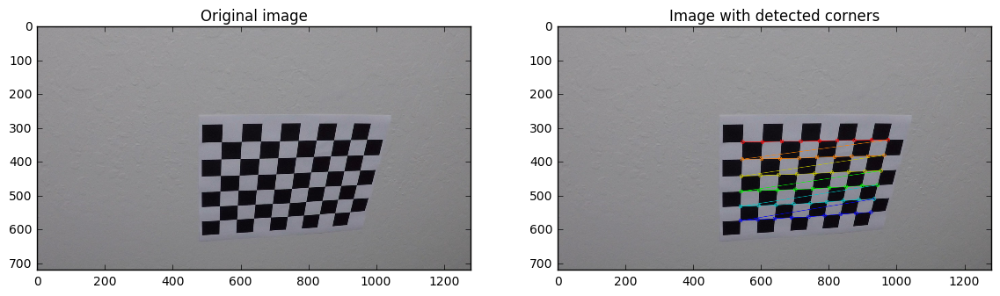

In [48]:
images = [calibration_images[1], corner_images[0]]
titles =  ['Original image','Image with detected corners']
plotImages(1, 2, images, titles)

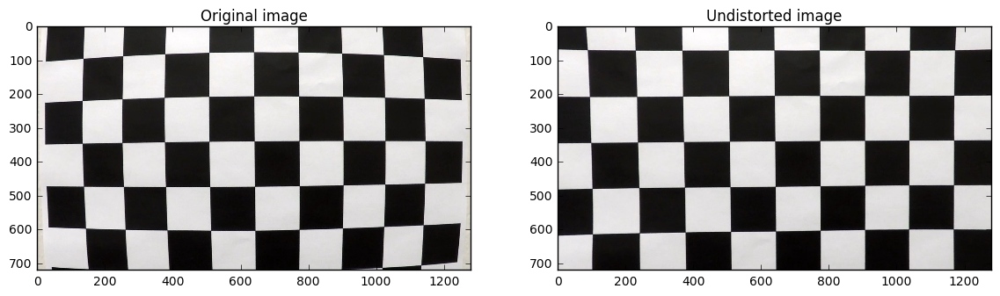

In [49]:
# Plot example undistorted image
images = [calibration_images[0], cv2.undistort(calibration_images[0], mtx, dist, None, mtx)]
titles =  ['Original image','Undistorted image']
plotImages(1, 2, images, titles)

### 2. Distortion correction

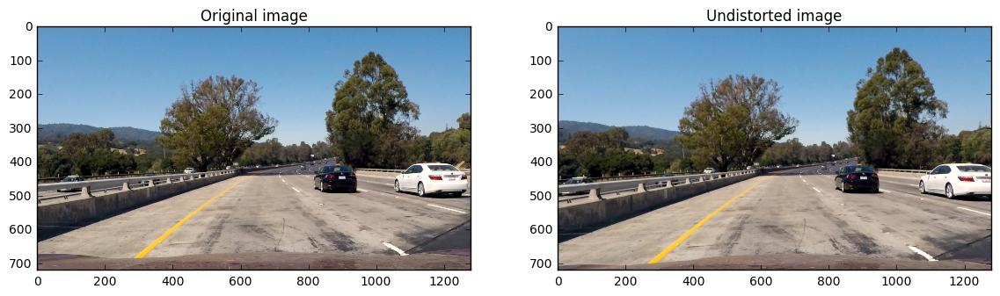

In [50]:
# Load camera calibration data
pickle_data = pickle.load(open(pickle_filename, 'rb'))
mtx = pickle_data['mtx']
dist = pickle_data['dist']

# Load test images
test_image_filepaths = glob.glob('./test_images/*.jpg')
test_image_filenames = [f.split('\\')[-1] for f in test_image_filepaths]
test_images = [cv2.imread(f) for f in test_image_filepaths]

# Undistort images
undistort_images = [cv2.undistort(i, mtx, dist, None, mtx) for i in test_images]

# Plot example images
images = [test_images[2], undistort_images[2]]
titles =  ['Original image','Undistorted image']
plotImages(1, 2, images, titles)

In [51]:
# Save undistorted images
saveImages(undistort_images, './test_images/undistort', test_image_filenames)

Saved file: ./test_images/undistort\straight_lines1.jpg
Saved file: ./test_images/undistort\straight_lines2.jpg
Saved file: ./test_images/undistort\test1.jpg
Saved file: ./test_images/undistort\test2.jpg
Saved file: ./test_images/undistort\test3.jpg
Saved file: ./test_images/undistort\test4.jpg
Saved file: ./test_images/undistort\test5.jpg
Saved file: ./test_images/undistort\test6.jpg


### 3. Color/gradient threshold

In [6]:
def abs_sobel_thresh(img, orient='x', thresh=(0, 255)):
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    if orient == 'x':
        sobel = cv2.Sobel(gray, cv2.CV_64F, 1, 0)
    if orient == 'y':
        sobel = cv2.Sobel(gray, cv2.CV_64F, 0, 1)
    abs_sobel = np.absolute(sobel)
    scaled_sobel = np.uint8(255 * abs_sobel / np.max(abs_sobel))
    binary_output = np.zeros_like(scaled_sobel)
    binary_output[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1
    return binary_output

def color_threshold(image, sthresh=(0, 255), vthresh=(0, 255)):
    hls = cv2.cvtColor(image, cv2.COLOR_BGR2HLS)
    s_channel = hls[:, :, 2]
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= sthresh[0]) & (s_channel < sthresh[1])] = 1

    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    v_channel = hsv[:, :, 2]
    v_binary = np.zeros_like(v_channel)
    v_binary[(v_channel >= vthresh[0]) & (v_channel < vthresh[1])] = 1

    output = np.zeros_like(s_channel)
    output[(s_binary == 1) & (v_binary == 1)] = 1
    return output

def thresholdImage(image):
    gradx = abs_sobel_thresh(image, orient='x', thresh=(12,100))
    grady = abs_sobel_thresh(image, orient='y', thresh=(25,100))
    c_binary = color_threshold(image, sthresh=(100, 255), vthresh=(50, 255))
    combined = np.zeros_like(c_binary)
    combined[((gradx == 1) & (grady == 1)) | (c_binary == 1)] = 255
    return combined

# Do thresholding
#threshold_images = [thresholdImage(i) for i in undistort_images]

"""# Plot example images
images = [undistort_images[2], threshold_images[2]]
titles =  ['Undistorted image','Thresholded image']
plotImages(1, 2, images, titles)"""

"# Plot example images\nimages = [undistort_images[2], threshold_images[2]]\ntitles =  ['Undistorted image','Thresholded image']\nplotImages(1, 2, images, titles)"

In [53]:
saveImages(threshold_images, './test_images/thresholded', test_image_filenames)

Saved file: ./test_images/thresholded\straight_lines1.jpg
Saved file: ./test_images/thresholded\straight_lines2.jpg
Saved file: ./test_images/thresholded\test1.jpg
Saved file: ./test_images/thresholded\test2.jpg
Saved file: ./test_images/thresholded\test3.jpg
Saved file: ./test_images/thresholded\test4.jpg
Saved file: ./test_images/thresholded\test5.jpg
Saved file: ./test_images/thresholded\test6.jpg


### 4. Perspective transform

In [7]:
def plotTransformImages(imgs, titles, dots):
    fig = plt.figure(figsize=(14, 10))
    for i, img in enumerate(imgs):
        plt.subplot(1, 2, i + 1)
        plt.title(titles[i])
        plt.imshow(img, cmap='gray')
        plt.plot(dots[i][0][0], dots[i][0][1], 'r.', ms=12) # top right
        plt.plot(dots[i][1][0], dots[i][1][1], 'r.', ms=12) # bottom right
        plt.plot(dots[i][2][0], dots[i][2][1], 'r.', ms=12) # bottom left
        plt.plot(dots[i][3][0], dots[i][3][1], 'r.', ms=12) # top left
    plt.show()
    
def transformImage(image, src, dst):
    M = cv2.getPerspectiveTransform(src, dst)
    warped = cv2.warpPerspective(image, M, (image.shape[1], image.shape[0]), flags=cv2.INTER_LINEAR)
    return warped

# Transformation coordinates
src = np.float32([[693, 455],[1075, 700],[230, 700],[588, 455]])
dst = np.float32([[950, 0],[950, 720],[250, 720],[250, 0]])

"""# Do transformation
transformed_images = [transformImage(i,src,dst) for i in  threshold_images]

# Plot example images
images = [threshold_images[0], transformed_images[0]]
titles = ['Original view image', 'Birds-eye view image']
plotTransformImages(images, titles, [src, dst])"""

"# Do transformation\ntransformed_images = [transformImage(i,src,dst) for i in  threshold_images]\n\n# Plot example images\nimages = [threshold_images[0], transformed_images[0]]\ntitles = ['Original view image', 'Birds-eye view image']\nplotTransformImages(images, titles, [src, dst])"

In [56]:
saveImages(transformed_images, './test_images/transformed', test_image_filenames)

Saved file: ./test_images/transformed\straight_lines1.jpg
Saved file: ./test_images/transformed\straight_lines2.jpg
Saved file: ./test_images/transformed\test1.jpg
Saved file: ./test_images/transformed\test2.jpg
Saved file: ./test_images/transformed\test3.jpg
Saved file: ./test_images/transformed\test4.jpg
Saved file: ./test_images/transformed\test5.jpg
Saved file: ./test_images/transformed\test6.jpg


### 5. Detect lane lines

In [8]:
def debugPlot(img, signal):
    plt.figure()
    plt.axes().get_yaxis().set_visible(False)
    plt.imshow(img, cmap='gray')
    plt.show()
    plt.figure()
    plt.axes().get_yaxis().set_visible(False)
    plt.plot(signal)
    plt.xlim((0,img.shape[1]))
    plt.show()
    return None

def findWindowCentroids(img, window_width, rows, margin=40, last_centroids=[0, 0], DEBUG=False):
    
    window_centroids = []
    
    window_height = int(img.shape[0] / rows)
    half_image_width = int(img.shape[1]/2)
    
    left_lane_x = last_centroids[0]
    right_lane_x = last_centroids[1]
    
    left_start = 0 if left_lane_x == 0 else left_lane_x - margin
    left_end = half_image_width - 1 if left_lane_x == 0 else left_lane_x + margin
    
    right_start = half_image_width if right_lane_x == 0 else right_lane_x - margin
    right_end = img.shape[1] - 1 if right_lane_x == 0 else right_lane_x + margin
    
    for i, y_window_pos in enumerate(range(img.shape[0], 0, -window_height)):
        row_image = img[y_window_pos - window_height: y_window_pos]
        conv_signal = np.convolve(np.ones(window_width), np.sum(row_image, axis=0))
        
        if DEBUG:
            return debugPlot(row_image, conv_signal)
            
        if window_centroids:
            left_lane_x, right_lane_x = window_centroids[-1]
            left_start = left_lane_x - margin
            left_end = left_lane_x + margin
            right_start = right_lane_x - margin
            right_end = right_lane_x + margin

        if np.max(conv_signal[left_start:left_end]) > 0:
            left_lane_x = np.argmax(conv_signal[left_start:left_end]) + left_start
        
        if np.max(conv_signal[right_start:right_end]) > 0:
            right_lane_x = np.argmax(conv_signal[right_start:right_end]) + right_start
        
        window_centroids.append((left_lane_x,right_lane_x))

    return np.array(window_centroids) - window_width / 2

def updateMask(mask, window_width, rows, image_shape, center, level):
    window_height = image_shape[0] / rows
    height_start = int(image_shape[0] - (level + 1) * window_height)
    height_end = int(image_shape[0] - level * window_height)
    width_start = max(0, int(center - window_width / 2))
    width_end = min(int(center + window_width / 2), image_shape[1])
    mask[height_start:height_end, width_start:width_end] = 255

def getWindowOverlayImage(image, window_centroids, window_width, rows):
    zeros = np.zeros_like(image)
    mask = np.zeros_like(image)
    
    # Go through each level and update window mask
    for i, centroid in enumerate(window_centroids):
        updateMask(mask, window_width, rows, image.shape, centroid[0], i)
        updateMask(mask, window_width, rows, image.shape, centroid[1], i)

    # Make window pixels green
    windows = np.array(cv2.merge((zeros, np.array(mask), zeros)), np.uint8)
    # Overlay the orignal road image with window results
    return cv2.addWeighted(cv2.cvtColor(image, cv2.COLOR_GRAY2RGB), 0.5, windows, 0.5, 0.0)

def getLaneImages(images, window_width, window_rows):
    
    output_images = []
    output_centroids = []
    
    for image in images:
        centroids = findWindowCentroids(image, window_width, window_rows)
        output_images.append(getWindowOverlayImage(image, centroids, window_width, window_rows))
        output_centroids.append(centroids)
    return output_images, output_centroids

"""# Detect lanes on all birds eye test images
detected_lane_images, detected_centroids = getLaneImages(transformed_images, 50, 8)

# Plot example images
images = [transformed_images[0], detected_lane_images[0]]
titles =  ['Birds-eye view image', 'Detected lane image']
plotImages(1, 2, images, titles)"""

"# Detect lanes on all birds eye test images\ndetected_lane_images, detected_centroids = getLaneImages(transformed_images, 50, 8)\n\n# Plot example images\nimages = [transformed_images[0], detected_lane_images[0]]\ntitles =  ['Birds-eye view image', 'Detected lane image']\nplotImages(1, 2, images, titles)"

Window and histogram example:


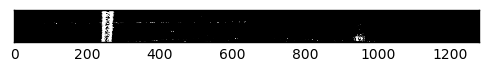

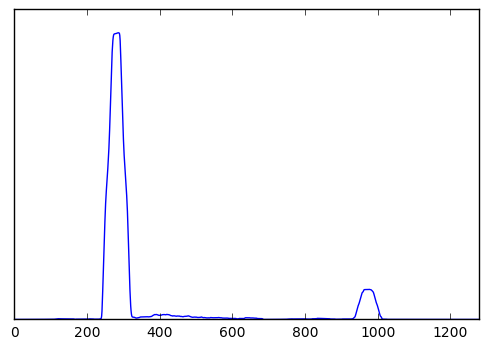

In [13]:
print('Window and histogram example:')
findWindowCentroids(transformed_images[0], 50, 8, DEBUG=True)

In [58]:
saveImages(detected_lane_images, './test_images/detected_lanes', test_image_filenames)

Saved file: ./test_images/detected_lanes\straight_lines1.jpg
Saved file: ./test_images/detected_lanes\straight_lines2.jpg
Saved file: ./test_images/detected_lanes\test1.jpg
Saved file: ./test_images/detected_lanes\test2.jpg
Saved file: ./test_images/detected_lanes\test3.jpg
Saved file: ./test_images/detected_lanes\test4.jpg
Saved file: ./test_images/detected_lanes\test5.jpg
Saved file: ./test_images/detected_lanes\test6.jpg


### 6. Determine the lane curvature

In [9]:
ym_per_pix = 30/720 # meters per pixel in y dimension
xm_per_pix = 3.7/700 # meters per pixel in x dimension
    
def textOverlay(img, res_yvals, yvals, leftx, left_fitx, right_fitx):
    curve_fit_cr = np.polyfit(np.array(res_yvals, np.float32)*ym_per_pix, np.array(leftx, np.float32) * xm_per_pix, 2)
    curverad = ((1 + (2 * curve_fit_cr[0] * yvals[-1] * ym_per_pix + curve_fit_cr[1])**2)**1.5) / np.absolute(2*curve_fit_cr[0])
    camera_center = (left_fitx[-1] + right_fitx[-1]) / 2
    center_diff = (camera_center-img.shape[1]/2) * xm_per_pix
    side_pos = 'left'
    if center_diff <= 0:
        side_pos = 'right'
    cv2.putText(img, 'Radius of Curvature = ' + str(round(curverad, 3)) + 'm', (50,50), cv2.FONT_HERSHEY_SIMPLEX, 1, 
        (255,255,255), 2)
    cv2.putText(img, 'Vehicle is ' + str(abs(round(center_diff,3))) + 'm ' + side_pos + ' of center', (50,100), 
        cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,255), 2)
    

def drawLane(img, centroids, transformed):
    
    img = img.copy()
    
    leftx = [i[0] for i in centroids]
    rightx = [i[1] for i in centroids]
    
    yvals = range(img.shape[0])
    res_yvals = np.arange(img.shape[0]-(img.shape[0]/16), 0, -img.shape[0] / len(centroids) )
    
    # f(x) = Ax**2 + Bx + C
    left_fit = np.polyfit(res_yvals, leftx, 2)
    left_fitx = np.array(left_fit[0] * yvals * yvals +  left_fit[1] * yvals + left_fit[2], np.int32)

    right_fit = np.polyfit(res_yvals, rightx, 2)
    right_fitx = np.array(right_fit[0] * yvals * yvals +  right_fit[1] * yvals + right_fit[2], np.int32)
    
    textOverlay(img, res_yvals, yvals, leftx, left_fitx, right_fitx)
    
    Minv = cv2.getPerspectiveTransform(dst, src)
    warp_zero = np.zeros_like(transformed).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    
    pts_left = np.array([np.transpose(np.vstack([left_fitx, yvals]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, yvals])))])
    pts = np.hstack((pts_left, pts_right))
    
    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (img.shape[1], img.shape[0]), flags=cv2.INTER_LINEAR)
    # Combine the result with the original image

    return cv2.addWeighted(img, 1, newwarp, 0.3, 0)
"""
lane_images = [drawLane(i, c, t) for i, c, t in zip(undistort_images, detected_centroids, transformed_images)]

# Plot sample images
images = [lane_images[0], lane_images[3]]
plotImages(1, 2, images, ['',''])"""

"\nlane_images = [drawLane(i, c, t) for i, c, t in zip(undistort_images, detected_centroids, transformed_images)]\n\n# Plot sample images\nimages = [lane_images[0], lane_images[3]]\nplotImages(1, 2, images, ['',''])"

In [16]:
saveImages(lane_images, './test_images/result', test_image_filenames)

Saved file: ./test_images/result\straight_lines1.jpg
Saved file: ./test_images/result\straight_lines2.jpg
Saved file: ./test_images/result\test1.jpg
Saved file: ./test_images/result\test2.jpg
Saved file: ./test_images/result\test3.jpg
Saved file: ./test_images/result\test4.jpg
Saved file: ./test_images/result\test5.jpg
Saved file: ./test_images/result\test6.jpg


### 7. Video

In [13]:
min_left_lane = []
max_left_lane = []
min_right_lane = []
max_right_lane = []

def processImage(image):
    
    img_undistorted = cv2.undistort(image, mtx, dist, None, mtx)
    img_thresholded = thresholdImage(img_undistorted)
    img_transformed = transformImage(img_thresholded, src, dst)
    centroids = findWindowCentroids(img_transformed, 50, 8)
    
    min_left_lane.append(centroids[:,0].min())
    max_left_lane.append(centroids[:,0].max())
    min_right_lane.append(centroids[:,1].min())
    max_right_lane.append(centroids[:,1].max())
    
    return drawLane(img_undistorted, centroids, img_transformed)
    
input_video = 'project_video.mp4'
output_video = './output_video/frankkanis-Test.mp4'

clip = VideoFileClip(input_video)
video_clip = clip.fl_image(processImage)
video_clip.write_videofile(output_video, audio=False)

[MoviePy] >>>> Building video ./output_video/frankkanis-Test.mp4
[MoviePy] Writing video ./output_video/frankkanis-Test.mp4


100%|█████████████████████████████████████████████████████████████████████████████▉| 1260/1261 [02:32<00:00,  8.26it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: ./output_video/frankkanis-Test.mp4 



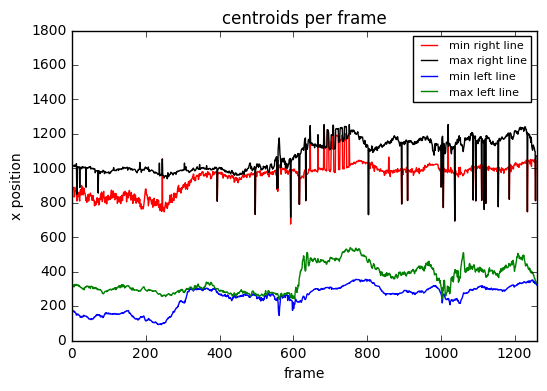

In [18]:
plt.plot(min_right_lane, label='min right line', color='red')
plt.plot(max_right_lane, label='max right line', color='black')
plt.plot(min_left_lane, label='min left line')
plt.plot(max_left_lane, label='max left line')
plt.title('centroids per frame')
plt.xlabel('frame')
plt.ylabel('x position')
plt.xlim([0,len(max_left_lane)])
plt.ylim([0,1800])
plt.legend(loc='upper right', prop={'size':8})
plt.show()

In [19]:
min_left_lane = []
max_left_lane = []
min_right_lane = []
max_right_lane = []

start_centroid = [0, 0]
smooth_centroids = collections.deque(maxlen=5)

def processImageSmooth(image):
    global smooth_centroids
    global start_centroid
    img_undistorted = cv2.undistort(image, mtx, dist, None, mtx)
    img_thresholded = thresholdImage(img_undistorted)
    img_transformed = transformImage(img_thresholded, src, dst)
    centroids = findWindowCentroids(img_transformed, 50,8, margin=50, last_centroids=start_centroid)
    
    smooth_centroids.append(centroids)
    smooth_centroids_np = np.array(smooth_centroids)
    new_centroids = smooth_centroids_np.mean(axis=0).astype(int)
    start_centroid = new_centroids[0]
    
    min_left_lane.append(new_centroids[:,0].min())
    max_left_lane.append(new_centroids[:,0].max())
    min_right_lane.append(new_centroids[:,1].min())
    max_right_lane.append(new_centroids[:,1].max())
    
    #DEBUG / TESTS
    #lanes = getWindowOverlayImage(img_transformed, centroids, 50, 8)
    #return_img = drawLane(img_undistorted, new_centroids, img_transformed)
    #img_threshold_3 = cv2.cvtColor(img_thresholded, cv2.COLOR_GRAY2RGB)
    #img_transformed_3 = cv2.cvtColor(img_transformed, cv2.COLOR_GRAY2RGB)
    #blank_image = np.zeros((image.shape[0],image.shape[1]+426, 3), np.uint8)
    #blank_image[0:img_threshold_3.shape[0],0:img_threshold_3.shape[1]] = return_img
    #blank_image[0:240,lane_images[0].shape[1]:] = cv2.resize(img_threshold_3,(426, 240))
    #blank_image[240:480,lane_images[0].shape[1]:] = cv2.resize(img_transformed_3,(426, 240))
    #blank_image[480:,lane_images[0].shape[1]:] = cv2.resize(lanes,(426, 240))
    
    return drawLane(img_undistorted, new_centroids, img_transformed)
    
input_video = './videos/project_video.mp4'
output_video = './videos/out_project_video_5.mp4'

clip = VideoFileClip(input_video)#.subclip(27,30)
video_clip = clip.fl_image(processImageSmooth)
video_clip.write_videofile(output_video, audio=False)

[MoviePy] >>>> Building video ./videos/out_project_video_5.mp4
[MoviePy] Writing video ./videos/out_project_video_5.mp4


100%|█████████████████████████████████████▉| 1260/1261 [02:37<00:00,  8.04it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: ./videos/out_project_video_5.mp4 



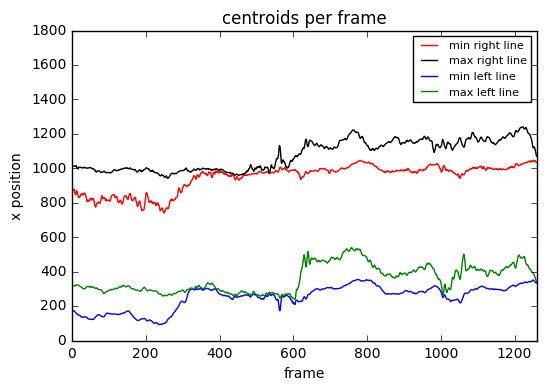

In [20]:
plt.plot(min_right_lane, label='min right line', color='red')
plt.plot(max_right_lane, label='max right line', color='black')
plt.plot(min_left_lane, label='min left line')
plt.plot(max_left_lane, label='max left line')
plt.title('centroids per frame')
plt.xlabel('frame')
plt.ylabel('x position')
plt.xlim([0,len(max_left_lane)])
plt.ylim([0,1800])
plt.legend(loc='upper right', prop={'size':8})
plt.show()

 ## 8. Challenge Videos

In [62]:
clip_challenge = VideoFileClip('./videos/challenge_video.mp4')

challenge_images = []
challenge_images.append(clip_challenge.get_frame(0))
challenge_images.append(clip_challenge.get_frame(2))
challenge_images.append(clip_challenge.get_frame(5))

challenge_images = [cv2.cvtColor(i, cv2.COLOR_BGR2RGB) for i in challenge_images]
challenge_images = [cv2.undistort(i, mtx, dist, None, mtx) for i in challenge_images]

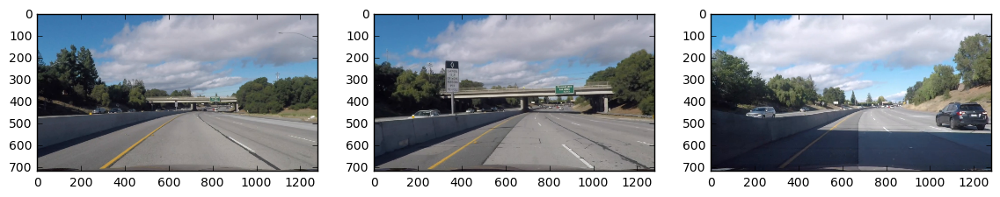

In [63]:
plotImages(1,3, challenge_images, ['']*len(challenge_images))

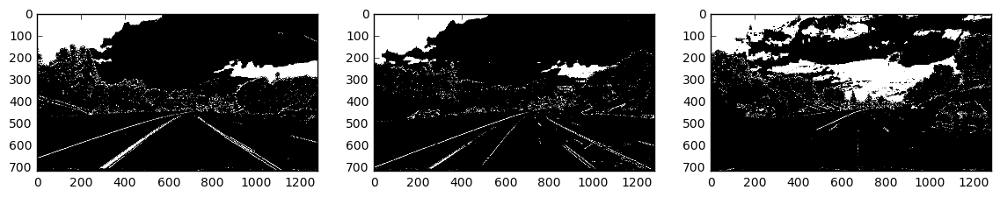

In [66]:
thresholded_images = [thresholdImage(i) for i in challenge_images]
plotImages(1,3, thresholded_images, ['']*len(thresholded_images))

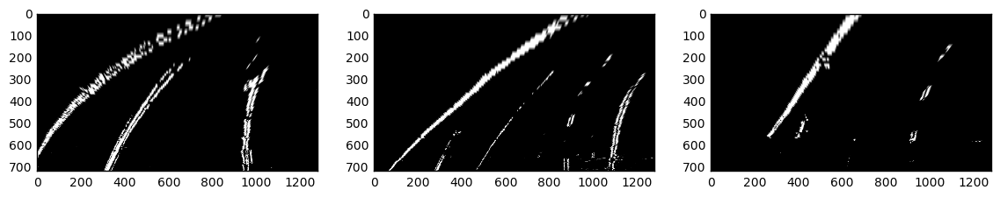

In [67]:
transformed_images = [transformImage(i, src, dst) for i in thresholded_images]
plotImages(1,3, transformed_images, ['']*len(transformed_images))

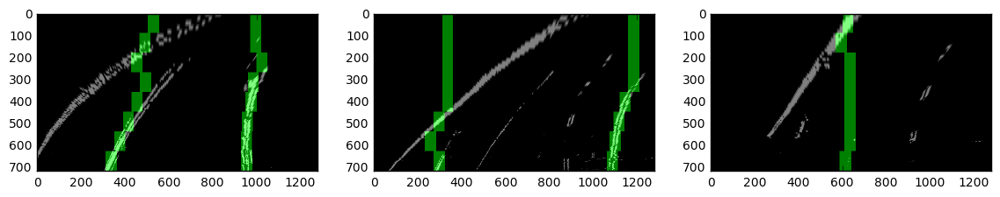

In [68]:
detected_lane_images, detected_centroids = getLaneImages(transformed_images, 50, 8)
plotImages(1,3, detected_lane_images, ['']*len(detected_lane_images))

In [71]:
def abs_sobel_thresh(img, orient='x', thresh=(0, 255)):
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    if orient == 'x':
        sobel = cv2.Sobel(gray, cv2.CV_64F, 1, 0)
    if orient == 'y':
        sobel = cv2.Sobel(gray, cv2.CV_64F, 0, 1)
    abs_sobel = np.absolute(sobel)
    scaled_sobel = np.uint8(255 * abs_sobel / np.max(abs_sobel))
    binary_output = np.zeros_like(scaled_sobel)
    binary_output[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1
    return binary_output

def color_threshold(image, sthresh=(0, 255), vthresh=(0, 255)):
    HSV = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)

    # For yellow
    yellow = cv2.inRange(HSV, (20, 100, 100), (50, 255, 255))
    
    # For white
    sensitivity_1 = 68
    white = cv2.inRange(HSV, (0,0,255-sensitivity_1), (255,20,255))

    sensitivity_2 = 60
    HSL = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
    white_2 = cv2.inRange(HSL, (0,255-sensitivity_2,0), (255,255,sensitivity_2))
    white_3 = cv2.inRange(image, (200,200,200), (255,255,255))
    
    #hls = cv2.cvtColor(image, cv2.COLOR_BGR2HLS)
    #s_channel = hls[:, :, 2]
    #s_binary = np.zeros_like(s_channel)
    #s_binary[(s_channel >= sthresh[0]) & (s_channel < sthresh[1])] = 1

    #hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    #v_channel = hsv[:, :, 2]
    #v_binary = np.zeros_like(v_channel)
    #v_binary[(v_channel >= vthresh[0]) & (v_channel < vthresh[1])] = 1

    #output = np.zeros_like(s_channel)
    #output[(s_binary == 1) & (v_binary == 1)] = 1
    return yellow | white | white_2 | white_3

def thresholdImage(image):
    gradx = abs_sobel_thresh(image, orient='x', thresh=(12,100))
    grady = abs_sobel_thresh(image, orient='y', thresh=(25,100))
    c_binary = color_threshold(image, sthresh=(100, 255), vthresh=(50, 255))
    combined = np.zeros_like(c_binary)
    combined[((gradx == 1) & (grady == 1)) | (c_binary == 1)] = 255
    return combined

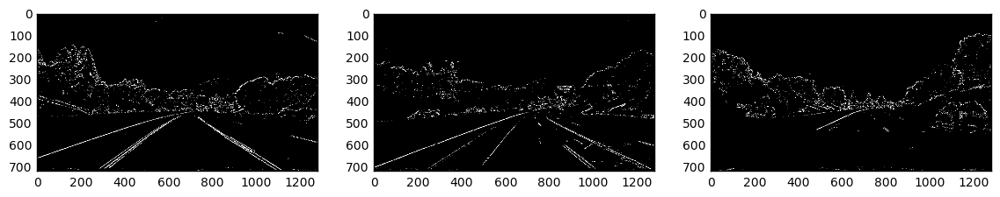

In [72]:
thresholded_images = [thresholdImage(i) for i in challenge_images]
plotImages(1,3, thresholded_images, ['']*len(thresholded_images))

### Tipps Udacity Review

Good job extracting the lane lines! An idea for more robust extraction is to try color thresholding in all the RGB, HSV and HSL channels for your yellows and whites! By using color thresholding you are able to make the lane detection more robust by relying less on gradients for good results! Furthermore, thresholding is a lot faster in terms of processing than gradients!

Here is some sample code to play around with, it should help with more tricky areas!

Your video looks great! Here is something I can share for more challenging videos where you may be unable to capture the lane lines!

You can use cv2.matchShapes as a means to make sure the final warp polygon is of quality before using. OpenCV's matchShapes, compares two shapes and returns a similarly index, with 0 being identical shapes. You can use this to make sure the polygon for your next frame is close to what it is expected to look like and if not you can elect to use old polygon instead. This way you can let your algorithm be really good when it can and when it can just fake it until a few frames later when it produces good results.

Here is an example: